# Apply `scanpy` to flow object

In [1]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import joypy

In [2]:
import warnings
warnings.simplefilter('ignore', UserWarning)
warnings.simplefilter('ignore', RuntimeWarning)
warnings.simplefilter('ignore', FutureWarning)
warnings.simplefilter('ignore', pd.errors.PerformanceWarning)

In [3]:
adata =sc.read_h5ad('8_color_data_set.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 859431 × 15
    obs: 'sample_id'
    uns: 'gate_hierarchy', 'transforms'
    obsm: 'gate_index'
    varm: 'stats'

In [5]:
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=75, facecolor='white')
sc.logging.print_header()

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.2.2 statsmodels==0.13.5 python-igraph==0.10.4 louvain==0.8.0 pynndescent==0.5.8


## Preprocessing

In [6]:
adata.var_names

Index(['FSC-A', 'FSC-H', 'FSC-W', 'SSC-A', 'SSC-H', 'SSC-W', 'TNFa FITC FLR-A',
       'CD8 PerCP-Cy55 FLR-A', 'IL2 BV421 FLR-A', 'Aqua Amine FLR-A',
       'IFNg APC FLR-A', 'CD3 APC-H7 FLR-A', 'CD107a PE FLR-A',
       'CD4 PE-Cy7 FLR-A', 'Time'],
      dtype='object')

In [7]:
exclude = ['FSC-A', 'FSC-H', 'FSC-W', 'SSC-A', 'SSC-H', 'SSC-W', 'Time']

Only keep fluroescence intensity markers

In [8]:
adata = adata[:, ~adata.var_names.isin(exclude)]

In [9]:
markers = [
    'Aqua Amine FLR-A',
    'CD3 APC-H7 FLR-A', 
    'CD4 PE-Cy7 FLR-A',
    'CD8 PerCP-Cy55 FLR-A',
    'TNFa FITC FLR-A',
    'IL2 BV421 FLR-A', 
    'IFNg APC FLR-A', 
    'CD107a PE FLR-A',
]

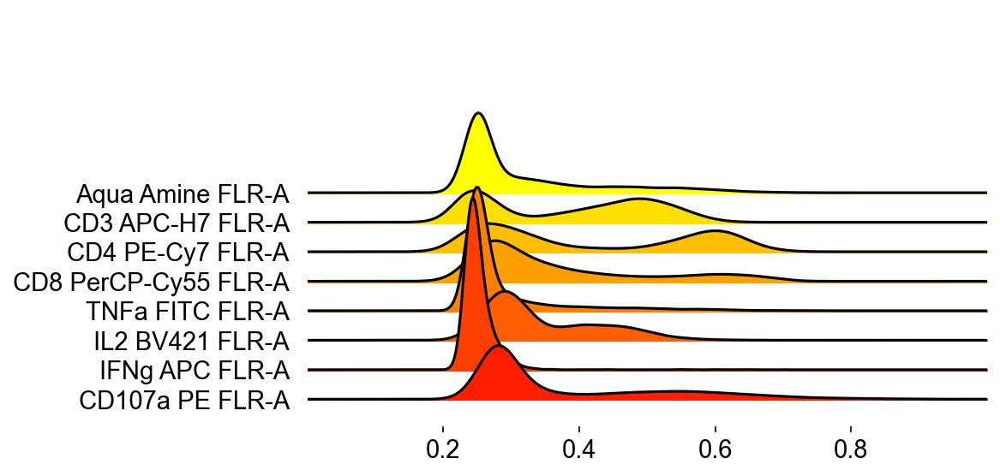

In [10]:
joypy.joyplot(adata.to_df().sample(10_000),
              figsize=(8,4),
              column = markers,
              x_range=[0, 1],
              colormap=plt.cm.autumn_r, 
              overlap=1.5)
pass

## Extract and plot gates

In [11]:
adata.obsm['gate_index'].columns

Index(['root:Time', 'root:Time:Singlets', 'root:Time:Singlets:aAmine-',
       'root:Time:Singlets:aAmine-:CD3+',
       'root:Time:Singlets:aAmine-:CD3+:CD4+',
       'root:Time:Singlets:aAmine-:CD3+:CD4+:CD107a+',
       'root:Time:Singlets:aAmine-:CD3+:CD4+:IFNg+',
       'root:Time:Singlets:aAmine-:CD3+:CD4+:IL2+',
       'root:Time:Singlets:aAmine-:CD3+:CD4+:TNFa+',
       'root:Time:Singlets:aAmine-:CD3+:CD8+',
       'root:Time:Singlets:aAmine-:CD3+:CD8+:CD107a+',
       'root:Time:Singlets:aAmine-:CD3+:CD8+:IFNg+',
       'root:Time:Singlets:aAmine-:CD3+:CD8+:IL2+',
       'root:Time:Singlets:aAmine-:CD3+:CD8+:TNFa+'],
      dtype='object')

In [12]:
pd.Series(adata.obsm['gate_index'].columns)

0                                        root:Time
1                               root:Time:Singlets
2                       root:Time:Singlets:aAmine-
3                  root:Time:Singlets:aAmine-:CD3+
4             root:Time:Singlets:aAmine-:CD3+:CD4+
5     root:Time:Singlets:aAmine-:CD3+:CD4+:CD107a+
6       root:Time:Singlets:aAmine-:CD3+:CD4+:IFNg+
7        root:Time:Singlets:aAmine-:CD3+:CD4+:IL2+
8       root:Time:Singlets:aAmine-:CD3+:CD4+:TNFa+
9             root:Time:Singlets:aAmine-:CD3+:CD8+
10    root:Time:Singlets:aAmine-:CD3+:CD8+:CD107a+
11      root:Time:Singlets:aAmine-:CD3+:CD8+:IFNg+
12       root:Time:Singlets:aAmine-:CD3+:CD8+:IL2+
13      root:Time:Singlets:aAmine-:CD3+:CD8+:TNFa+
dtype: object

In [13]:
cd4_funcs = adata.obsm['gate_index'].iloc[:, [5,6,7,8]]
cd4_bool = cd4_funcs.apply(lambda xs: np.sum([x*2**i for (i, x) in enumerate(xs)]), axis=1)
cd4_num_funcs = cd4_funcs.apply(lambda xs: xs.sum(), axis=1)

In [14]:
adata.obs['cd4'] = pd.Categorical(adata.obsm['gate_index'].iloc[:, 4].astype(int).astype('str'))
adata.obs['cd4_bool'] = pd.Categorical(cd4_bool.astype('str').str.zfill(2))
adata.obs['cd4_funcs'] = pd.Categorical(cd4_num_funcs.astype('str'))

In [15]:
cd8_funcs = adata.obsm['gate_index'].iloc[:, [10,11,12,13]]
cd8_bool = cd8_funcs.apply(lambda xs: np.sum([x*2**i for (i, x) in enumerate(xs)]), axis=1)
cd8_num_funcs = cd8_funcs.apply(lambda xs: xs.sum(), axis=1)

In [16]:
adata.obs['cd8'] = pd.Categorical(adata.obsm['gate_index'].iloc[:, 9].astype('int').astype('str'))
adata.obs['cd8_bool'] = pd.Categorical(cd8_bool.astype('str').str.zfill(2))
adata.obs['cd8_funcs'] = pd.Categorical(cd8_num_funcs.astype('str'))

## Computing the neighborhood graph


To speed up UMAP calculations,
```
pip install pynndescent
```

Subsample to speed things up

In [17]:
data = sc.pp.subsample(adata, n_obs=50_000, copy=True)

In [18]:
%%time
sc.pp.neighbors(data, n_neighbors=10, n_pcs=0)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:10)
CPU times: user 12 s, sys: 268 ms, total: 12.2 s
Wall time: 10.4 s


In [19]:
%%time
sc.tl.leiden(data, resolution=0.1)

running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)
CPU times: user 2.37 s, sys: 69.8 ms, total: 2.44 s
Wall time: 2.44 s


In [20]:
%%time
sc.tl.paga(data)

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
CPU times: user 639 ms, sys: 18.3 ms, total: 657 ms
Wall time: 656 ms


--> added 'pos', the PAGA positions (adata.uns['paga'])


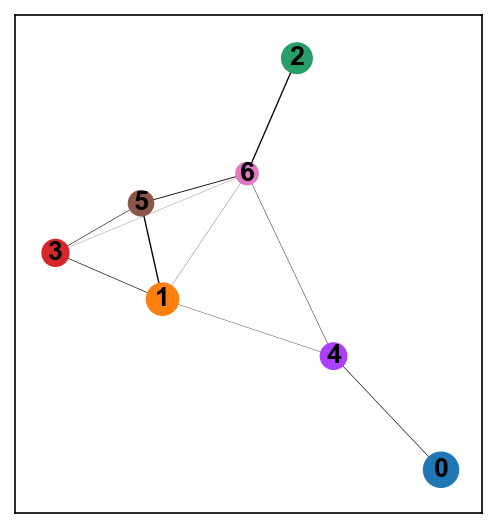

In [21]:
sc.pl.paga(data)

By quantifying the connectivity of partitions (groups, clusters) of the
single-cell graph, partition-based graph abstraction (PAGA) generates a much
simpler abstracted graph (*PAGA graph*) of partitions, in which edge weights
represent confidence in the presence of connections. By tresholding this
confidence in :func:`~scanpy.pl.paga`, a much simpler representation of the
manifold data is obtained, which is nonetheless faithful to the topology of
the manifold.

In [22]:
%%time
sc.tl.umap(data, init_pos='paga')

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:20)
CPU times: user 20.9 s, sys: 206 ms, total: 21.1 s
Wall time: 20.6 s


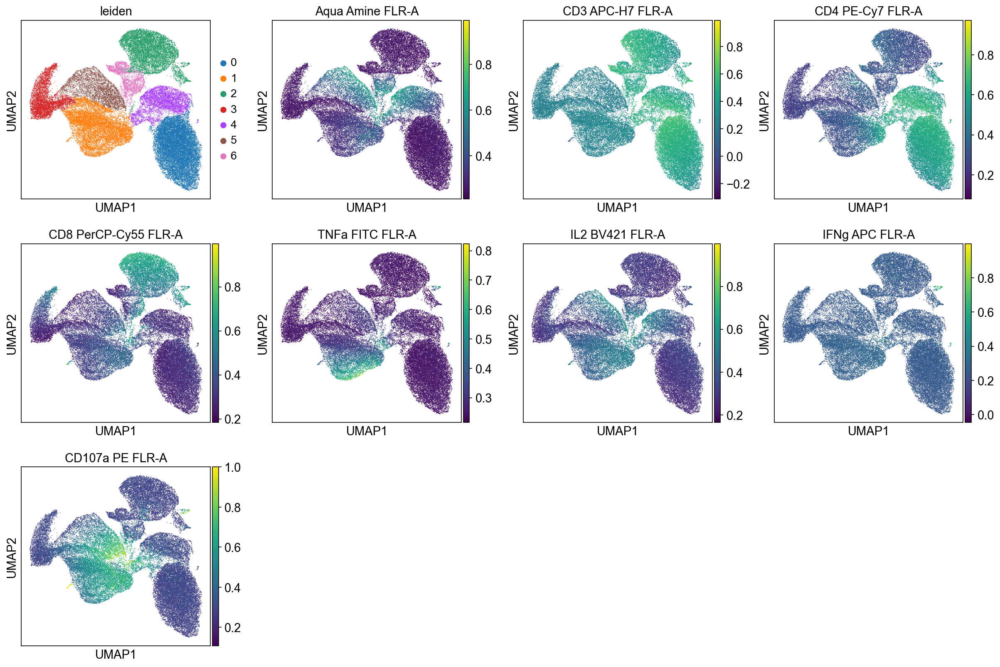

CPU times: user 2.71 s, sys: 301 ms, total: 3.01 s
Wall time: 1.99 s


In [42]:
%%time
sc.pl.umap(data, color=['leiden'] + markers)

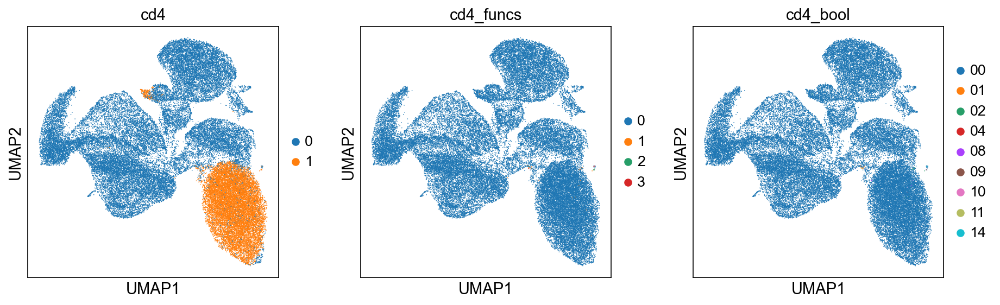

CPU times: user 1.27 s, sys: 217 ms, total: 1.49 s
Wall time: 808 ms


In [24]:
%%time
sc.pl.umap(data, color=['cd4', 'cd4_funcs', 'cd4_bool'], cmap='turbo')

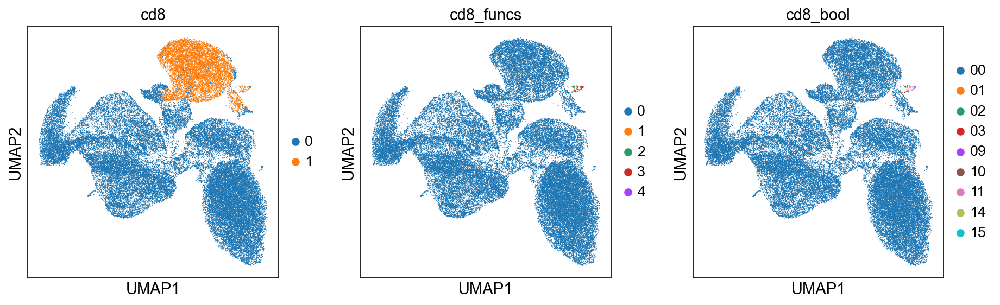

In [25]:
sc.pl.umap(data, color=['cd8', 'cd8_funcs', 'cd8_bool'], cmap='turbo')

In [26]:
sc.tl.embedding_density(
    data,
    groupby='cd4'
)

computing density on 'umap'
--> added
    'umap_density_cd4', densities (adata.obs)
    'umap_density_cd4_params', parameter (adata.uns)


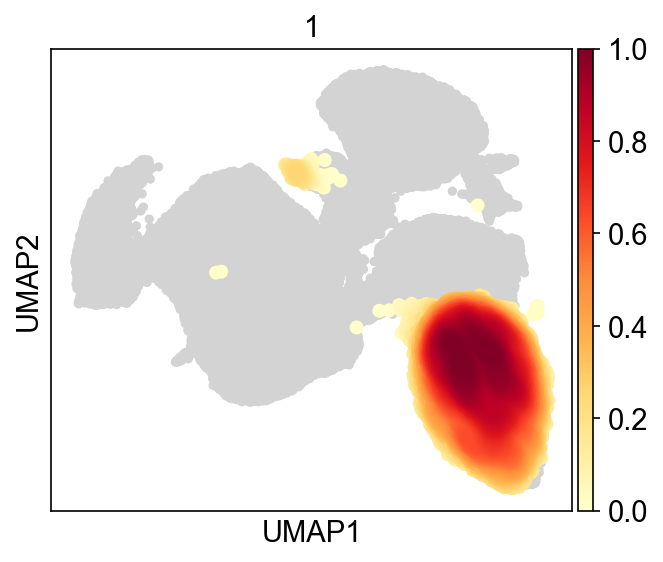

In [27]:
sc.pl.embedding_density(
    data,
    groupby='cd4',
    group='1'
)

In [28]:
sc.tl.embedding_density(
    data,
    groupby='cd4_funcs'
)

computing density on 'umap'
--> added
    'umap_density_cd4_funcs', densities (adata.obs)
    'umap_density_cd4_funcs_params', parameter (adata.uns)


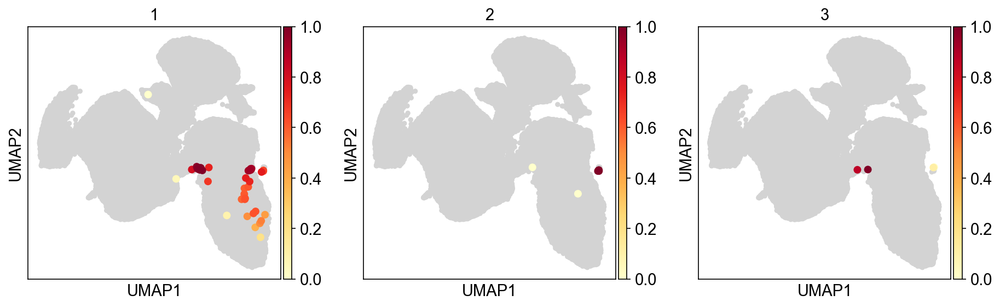

In [29]:
sc.pl.embedding_density(
    data,
    groupby='cd4_funcs',
    group=['1','2','3']
)

In [30]:
sc.tl.embedding_density(
    data,
    groupby='cd8'
)

computing density on 'umap'
--> added
    'umap_density_cd8', densities (adata.obs)
    'umap_density_cd8_params', parameter (adata.uns)


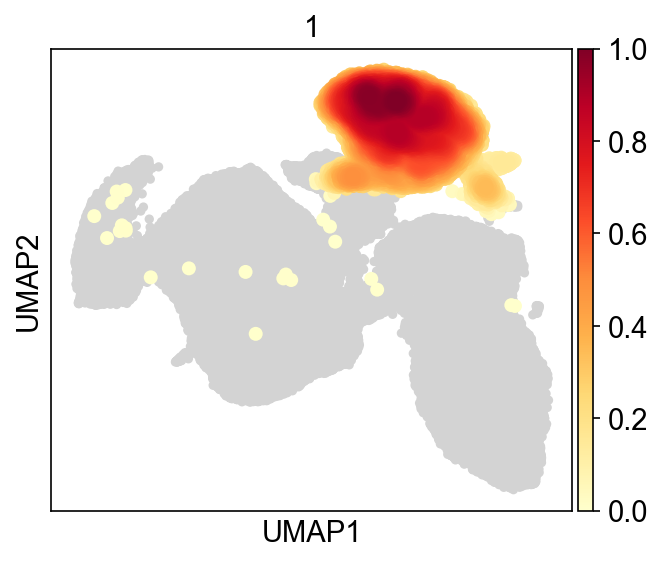

In [31]:
sc.pl.embedding_density(
    data,
    groupby='cd8',
    group='1'
)

In [32]:
sc.tl.embedding_density(
    data,
    groupby='cd8_funcs',
)

computing density on 'umap'
--> added
    'umap_density_cd8_funcs', densities (adata.obs)
    'umap_density_cd8_funcs_params', parameter (adata.uns)


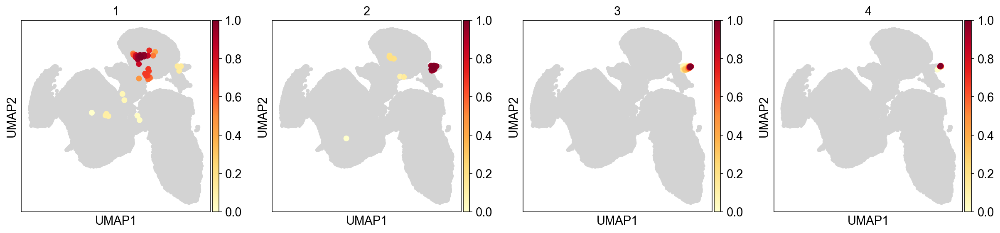

In [33]:
sc.pl.embedding_density(
    data,
    groupby='cd8_funcs',
    group=['1', '2', '3', '4'],

)

## Next example: Repeat but for CD8 T cells only

In [34]:
cd8_data = adata[adata.obsm['gate_index']['root:Time:Singlets:aAmine-:CD3+:CD8+']]

In [35]:
cd8_data

View of AnnData object with n_obs × n_vars = 140676 × 8
    obs: 'sample_id', 'cd4', 'cd4_bool', 'cd4_funcs', 'cd8', 'cd8_bool', 'cd8_funcs'
    uns: 'gate_hierarchy', 'transforms'
    obsm: 'gate_index'
    varm: 'stats'

In [36]:
sc.pp.neighbors(cd8_data, n_neighbors=30, n_pcs=0)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:19)


In [37]:
sc.tl.leiden(cd8_data, resolution=0.2)

running Leiden clustering
    finished: found 5 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:42)


In [38]:
sc.tl.paga(cd8_data)

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:03)


--> added 'pos', the PAGA positions (adata.uns['paga'])


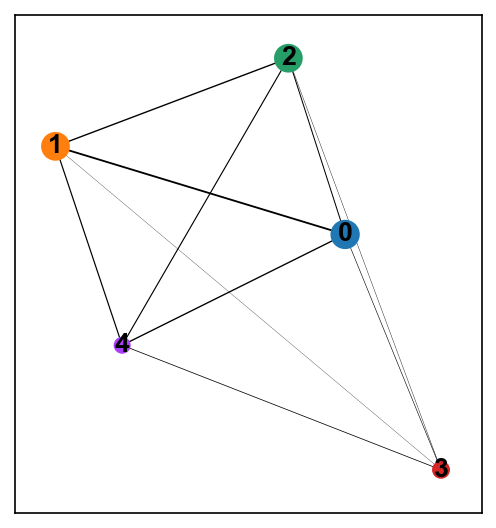

In [39]:
sc.pl.paga(cd8_data)

In [40]:
sc.tl.umap(cd8_data, init_pos='paga')

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:30)


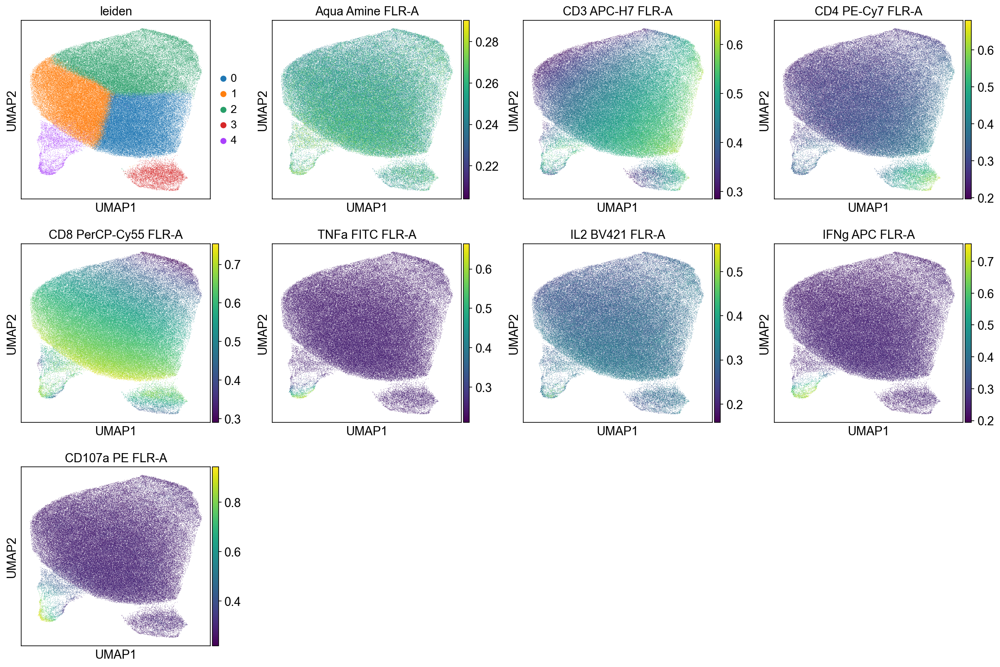

In [41]:
sc.pl.umap(
    cd8_data, 
    color=['leiden'] + markers,
)

In [43]:
sc.tl.embedding_density(
    cd8_data,
    groupby='leiden'
)

computing density on 'umap'
--> added
    'umap_density_leiden', densities (adata.obs)
    'umap_density_leiden_params', parameter (adata.uns)


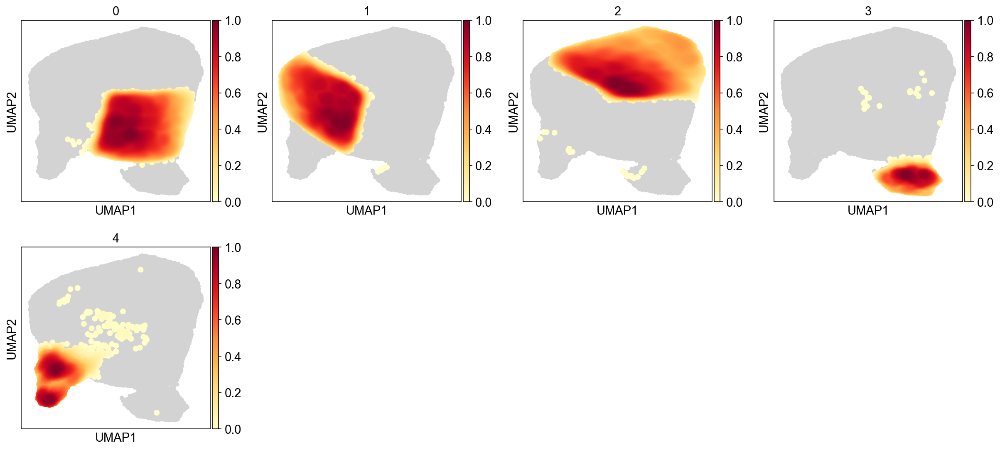

In [44]:
sc.pl.embedding_density(
    cd8_data,
    groupby='leiden',
)

## Finding markers

In [45]:
sc.tl.rank_genes_groups(
    cd8_data,
    groupby='leiden',
    method='wilcoxon'
)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


In [52]:
sc.pl.violin?

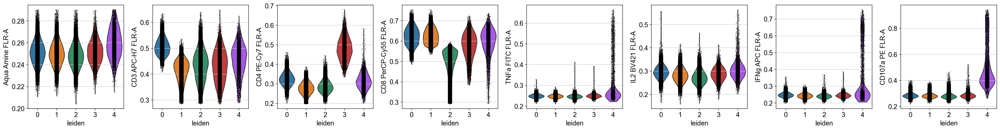

In [51]:
sc.pl.violin(cd8_data, markers, groupby='leiden', )

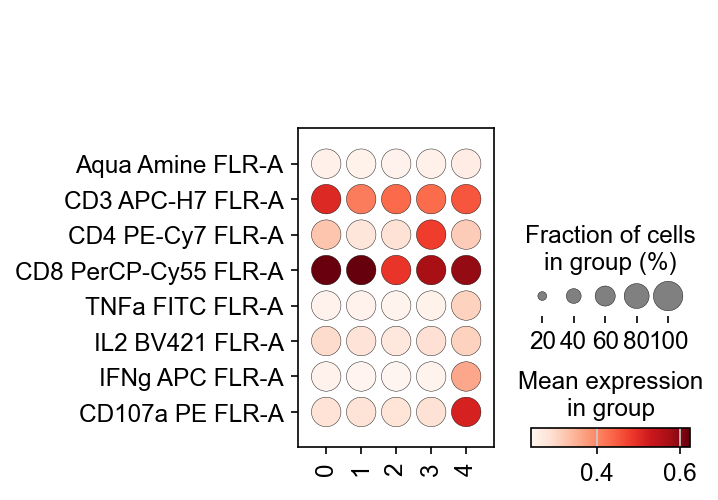

In [53]:
sc.pl.dotplot(cd8_data, markers, groupby='leiden', swap_axes=True)

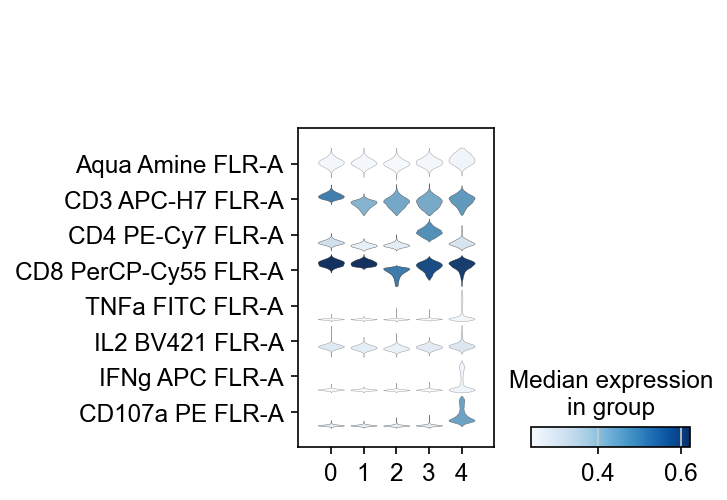

In [54]:
sc.pl.stacked_violin(cd8_data, markers, groupby='leiden', rotation=90, swap_axes=True)

In [57]:
sc.tl.dendrogram(cd8_data, groupby='leiden')

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_leiden']`


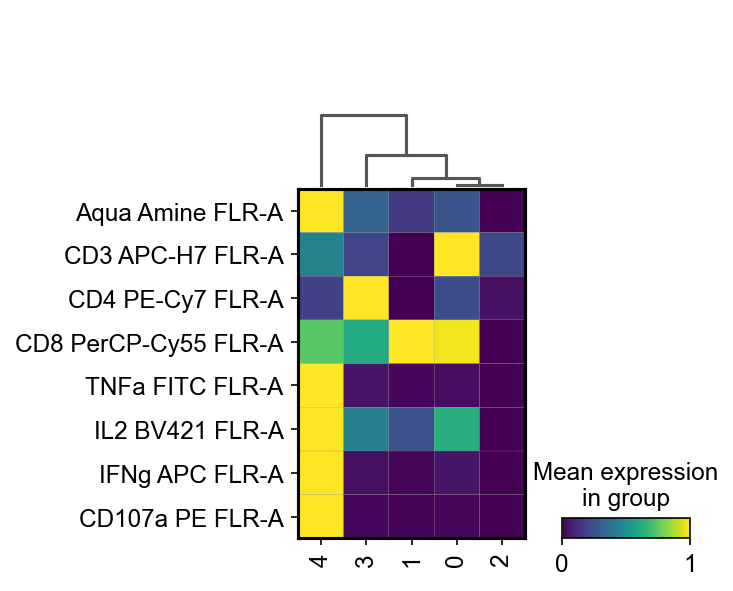

In [58]:
sc.pl.matrixplot(
    cd8_data,
    markers, 
    groupby='leiden',
    swap_axes=True,
    standard_scale='var', 
    log=False,
    dendrogram=True,
)

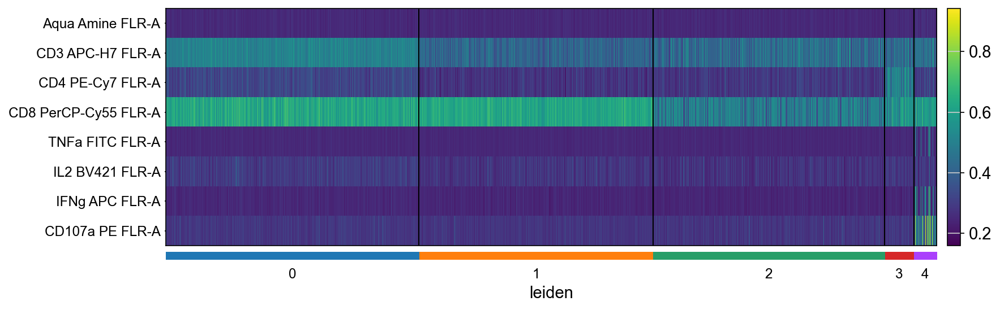

In [59]:
sc.pl.heatmap(
    cd8_data,
    markers,
    groupby='leiden',
    swap_axes=True,
    figsize=(12,4)
)

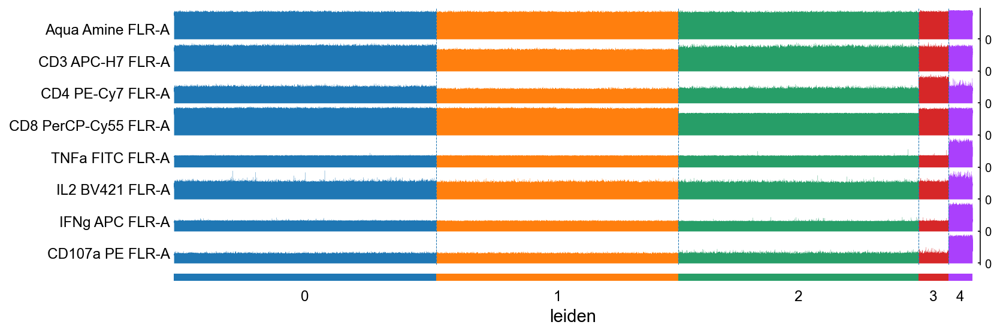

In [60]:
sc.pl.tracksplot(
    cd8_data,
    markers,
    groupby='leiden',
    swap_axes=True,
    figsize=(12,4)
)

In [61]:
cd8_data.layers['scaled'] = sc.pp.scale(cd8_data, copy=True).X

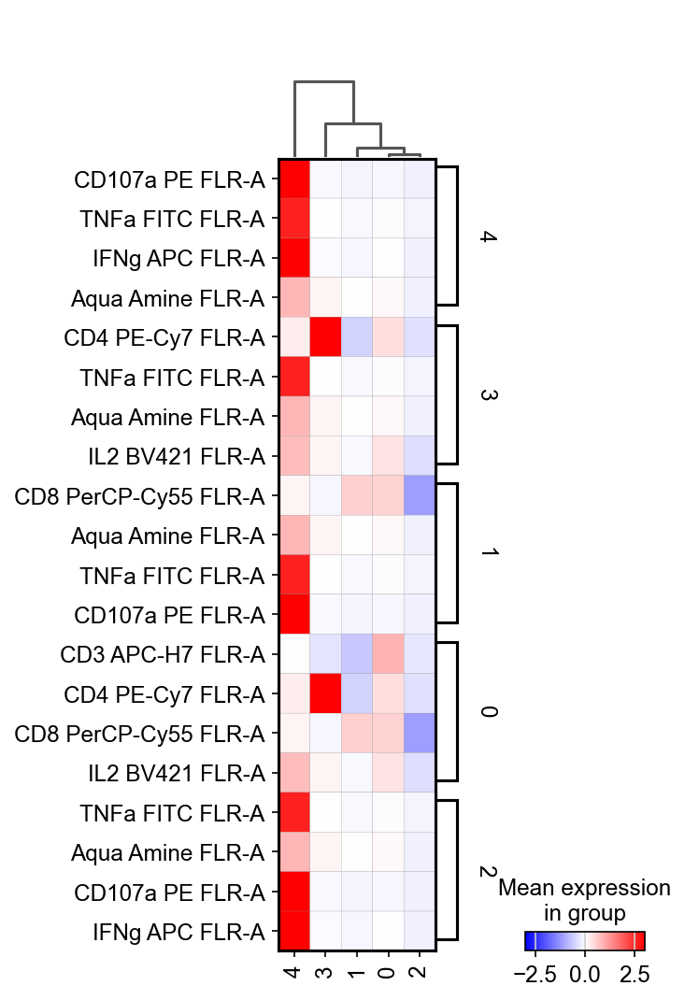

In [64]:
sc.pl.rank_genes_groups_matrixplot(
    cd8_data, 
    n_genes=4, 
    use_raw=False, 
    vmin=-3,
    vmax=3,
    cmap='bwr',
    layer='scaled',
    swap_axes=True,)

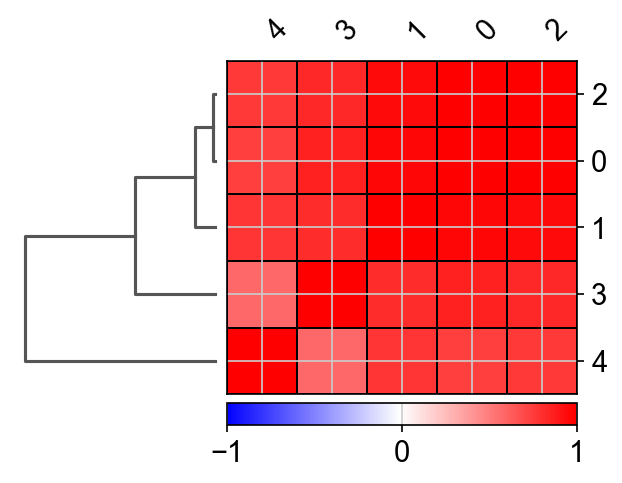

In [65]:
sc.pl.correlation_matrix(
    cd8_data,
    groupby='leiden',
)
